## HW6 Diffusion Model

**Sources:**
- Github implementation [Denoising Diffusion Pytorch](https://github.com/lucidrains/denoising-diffusion-pytorch)
- Papers on Diffusion models ([Dhariwal, Nichol, 2021], [Ho et al., 2020] ect.)


In [6]:
!pip install einops
!pip install transformers
!pip install ema_pytorch
!pip install accelerate
print("pip install complete!")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.8 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 26.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.9 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 72.9 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.9.41
    Uninstalling nvidia-nvjitlink-cu12-12.9.41:
      Successfully uninstalled nvidia-nvjitlink-cu12-12.9.41
  Attempting uninstall: nvidia-curand-cu12
    Found existing installation: nvidia-curand-cu12 10.3.10.19
    Uninstalling nvidia-curand-cu12-

In [4]:
import math
import copy
from pathlib import Path
from random import random
from functools import partial
from collections import namedtuple
from multiprocessing import cpu_count

import torch
from torch import nn, einsum
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from torch.optim import Adam

import torchvision
from torchvision import transforms as T, utils

from einops import rearrange, reduce, repeat
from einops.layers.torch import Rearrange

from PIL import Image
from tqdm.auto import tqdm
from ema_pytorch import EMA

from accelerate import Accelerator
import matplotlib.pyplot as plt
import os
import torch
import torch.nn as nn

torch.backends.cudnn.benchmark = True
torch.manual_seed(4096)

if torch.cuda.is_available():
  torch.cuda.manual_seed(4096)

print("import complete!")

import complete!


Step 1: Forward process (Noise scheduler)




解释线性beta调度器和extract函数
linear_beta_schedule 这个函数用于生成Diffusion模型(如DDPM)中的噪声调度参数β。
在Diffusion模型中，β_t控制着每个时间步t添加的噪声量
这个函数实现了原始DDPM论文中提出的线性调度策略
β值从很小的值(β_start)线性增加到较大的值(β_end)

extract函数 这个函数用于从数组中提取对应时间步t的值并重塑形状以匹配输入数据。
这个函数高效地从参数数组a中收集对应t的值，并重塑为与输入x相同的维度(除了batch维度)

In [5]:
def linear_beta_schedule(timesteps):
    # 缩放因子，将timesteps标准化到1000的基准
    scale = 1000 / timesteps
    # 起始β值(论文中1000步时是0.0001)
    beta_start = scale * 0.0001
     # 结束β值(论文中1000步时是0.02)
    beta_end = scale * 0.02
    # 生成线性间隔的β序列
    return torch.linspace(beta_start, beta_end, timesteps, dtype = torch.float64)

def extract(a, t, x_shape):
    b, *_ = t.shape  # 获取batch大小(b)，忽略t的其他维度
    out = a.gather(-1, t) # 从数组a的最后维度收集对应t索引的值
    return out.reshape(b, *((1,) * (len(x_shape) - 1)))  
    # 重塑为(b,1,1,...)形状以匹配x

print("function defined!")

function defined!


In [6]:
class Dataset(Dataset):
    def __init__(
        self,
        folder,
        image_size
    ):
        self.folder = folder
        self.image_size = image_size
        self.paths = [p for p in Path(f'{folder}').glob(f'**/*.jpg')]
        # 这块做了数据增强(在transform中增加更多的图像变换操作)
        self.transform = T.Compose([
            T.Resize(image_size),
            T.ToTensor(),
            T.ColorJitter(brightness = 0.2, contrast = 0.2, saturation = 0.2,hue = 0.1),
            T.RandomHorizontalFlip(p = 0.5),
            T.RandomRotation(degrees = 15),
            T.RandomAdjustSharpness(sharpness_factor = 2, p = 0.3),
            T.GaussianBlur(kernel_size = 3,sigma = (0.1,2.0)),
            T.RandomResizedCrop(size = image_size,scale = (0.8,1.0)),
            T.Normalize(mean = [0.5,0.5,0.5], std = [0.5,0.5,0.5])
        ])

    def __len__(self):
        return len(self.paths)

    def __getitem__(self,index):
        path = self.paths[index]
        img = Image.open(path)
        return self.transform(img)

print("Dataset defined Complete!")

Dataset defined Complete!


Step 2: The backward process = U-Net



一个 U-Net 结构的扩散模型（Diffusion Model），主要用于 图像生成任务（如图像去噪、超分辨率、图像合成等）。
核心功能
噪声预测：在扩散过程中逐步去除图像中的噪声。
条件生成：通过时间步嵌入（time_emb）控制生成过程。
多尺度特征提取：通过下采样（Downsample）和上采样（Upsample）捕捉图像的全局和局部信息。

扩散模型工作原理
1.前向扩散：逐步向图像添加噪声（训练时模拟）。
2.反向去噪：U-Net 学习预测噪声，通过迭代去噪生成图像。
3.时间步控制：time_mlp 将时间步编码为条件向量，指导每一步的去噪过程


In [11]:
def exists(x):
    return x is not None

def default(val,d):
    if exists(val):
        return val
    return d() if callable(d) else d 

def identity(t,*args,**kwargs):
    return t

def cycle(dl):
    while True:
        for data in dl:
            yield data #使用生成器（yield）而不是返回列表，避免内存爆炸

def has_int_squareroot(num):
    return (math.sqrt(num) ** 2) == num

def num_to_groups(num,divisor):
    groups = num // divisor
    remainder = num % divisor
    arr = [divisor] * groups
    if remainder > 0:
        arr.append(remainder)
    return arr

# normalization functions

def normalize_to_neg_one_to_one(img):
    return img * 2 - 1

def unnormalize_to_zero_to_one(t):
    return (t + 1) * 0.5

# 一些小的模块
class Residual(nn.Module):
    def __init__(self,fn):
        super().__init__()
        self.fn = fn

    def forward(self, x, *args, **kwargs):
        return self.fn(x, *args, **kwargs) + x

def Upsample(dim, dim_out = None):
        return nn.Sequential(
            nn.Upsample(scale_factor = 2, mode = 'nearest'),
            nn.Conv2d(dim,default(dim_out, dim), 3 ,padding = 1)
        )

def Downsample(dim, dim_out = None):
        return nn.Sequential(
            Rearrange('b c (h p1) (w p2) -> b (c p1 p2) h w', p1 = 2, p2 = 2),
            nn.Conv2d(dim * 4, default(dim_out, dim), 1)
        )
class WeightStandardizedConv2d(nn.Conv2d):
    def forward(self, x):
        eps = 1e-5 if x.dtype == torch.float32 else 1e-3

        weight = self.weight
        mean = reduce(weight, 'o ... -> o 1 1 1', 'mean')
        var = reduce(weight, 'o ... -> o 1 1 1', partial(torch.var, unbiased = False))
        normalized_weight = (weight - mean) * (var + eps).rsqrt()

        return F.conv2d(x, normalized_weight, self.bias, self.stride, self.padding, self.dilation, self.groups)

# 层归一化 专为 4D 图像数据（BCHW 格式） 设计。
class LayerNorm(nn.Module):
    def __init__(self, dim):
        super().__init__()
        # 初始化一个可学习的缩放参数 g。
        self.g = nn.Parameter(torch.ones(1, dim, 1, 1))

    def forward(self, x):
        eps = 1e-5 if x.dtype == torch.float32 else 1e-3
        # 沿通道维度（dim=1）计算均值和方差。
        var = torch.var(x, dim = 1, unbiased = False, keepdim = True)
        mean = torch.mean(x, dim = 1, keepdim = True)
        # 还是那个归一化公式
        return (x - mean) * (var + eps).rsqrt() * self.g


class PreNorm(nn.Module):
    def __init__(self, dim, fn):
        super().__init__()
        self.fn = fn
        self.norm = LayerNorm(dim)

    def forward(self, x):
        x = self.norm(x)
        return self.fn(x)


# 正弦编码是用数学方法把位置/时间信息转换成向量，让模型能理解顺序关系。比可学习的嵌入更稳定，比纯标量输入更丰富。

class SinusoidalPosEmb(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, x):
        device = x.device
        half_dim = self.dim // 2
        # 计算频率衰减系数：log(10000)/(half_dim-1)
        # 10000是原始Transformer论文设定的基准频率
        emb = math.log(10000) / (half_dim - 1)
        # 生成指数衰减的频率序列：
        # exp( -i * log(10000)/(half_dim-1) )，i从0到half_dim-1
        # 相当于构建[1, 1/10000^(1/d), 1/10000^(2/d), ...]的几何序列
        emb = torch.exp(torch.arange(half_dim, device=device) * -emb)
        # 外积计算位置编码相位：
        # x[:, None]是位置索引（如timestep t） 
        # emb[None, :]是频率序列
        # 结果emb的形状为[batch_size, half_dim]
        emb = x[:, None] * emb[None, :]
        # 拼接正弦和余弦部分：
        # sin(θ)和cos(θ)拼接后形状变为[batch_size, 2*half_dim] = [batch_size, dim]
        emb = torch.cat((emb.sin(), emb.cos()), dim=-1)
        return emb

class RandomOrLearnedSinusoidalPosEmb(nn.Module):
   
    def __init__(self, dim, is_random = False):
        super().__init__()
        assert (dim % 2) == 0 # 确保维度是偶数（因为要拆分为sin/cos两部分）
        half_dim = dim // 2
        # 初始化一个长度为half_dim的随机权重向量 self.weights。
        self.weights = nn.Parameter(torch.randn(half_dim), requires_grad = not is_random)
        # is_random：若为True，则使用固定的随机权重（不可学习）；若为False，则权重可学习。
    
    def forward(self, x):
        x = rearrange(x, 'b -> b 1') # 将输入x从[batch_size]变为[batch_size, 1]
        freqs = x * rearrange(self.weights, 'd -> 1 d') * 2 * math.pi # 计算相位角
        # 对相位角 freqs 分别计算 sin 和 cos，得到形状各为 [batch_size, half_dim] 的张量。
        # 沿最后一维拼接，输出形状变为 [batch_size, dim]。
        fouriered = torch.cat((freqs.sin(), freqs.cos()), dim = -1)
        # 将原始输入 x（形状 [batch_size, 1]）与编码后的向量拼接。
        #最终输出形状为 [batch_size, dim + 1]（比输入 dim 多1维）。
        fouriered = torch.cat((x, fouriered), dim = -1) 
        return fouriered


class Block(nn.Module):
    def __init__(self, dim, dim_out, groups = 8):
        super().__init__()
        self.proj = WeightStandardizedConv2d(dim, dim_out, 3, padding = 1)
        self.norm = nn.GroupNorm(groups, dim_out)
        self.act = nn.SiLU()

    def forward(self, x, scale_shift = None):
        x = self.proj(x)
        x = self.norm(x)

        if exists(scale_shift):
            scale, shift = scale_shift
            x = x * (scale + 1) + shift

        x = self.act(x)
        return x


class ResnetBlock(nn.Module):
    def __init__(self, dim, dim_out, *, time_emb_dim = None, groups = 8):
        super().__init__()
        self.mlp = nn.Sequential(
            nn.SiLU(),
            nn.Linear(time_emb_dim, dim_out * 2)
        ) if exists(time_emb_dim) else None

        self.block1 = Block(dim, dim_out, groups = groups)
        self.block2 = Block(dim_out, dim_out, groups = groups)
        self.res_conv = nn.Conv2d(dim, dim_out, 1) if dim != dim_out else nn.Identity()

    def forward(self, x, time_emb = None):

        scale_shift = None
        if exists(self.mlp) and exists(time_emb):
            time_emb = self.mlp(time_emb)
            time_emb = rearrange(time_emb, 'b c -> b c 1 1')
            scale_shift = time_emb.chunk(2, dim = 1)

        h = self.block1(x, scale_shift = scale_shift)

        h = self.block2(h)

        return h + self.res_conv(x)


class LinearAttention(nn.Module):
    def __init__(self, dim, heads = 4, dim_head = 32):
        super().__init__()
        self.scale = dim_head ** -0.5
        self.heads = heads
        hidden_dim = dim_head * heads
        self.to_qkv = nn.Conv2d(dim, hidden_dim * 3, 1, bias = False)

        self.to_out = nn.Sequential(
            nn.Conv2d(hidden_dim, dim, 1),
            LayerNorm(dim)
        )

    def forward(self, x):
        b, c, h, w = x.shape
        qkv = self.to_qkv(x).chunk(3, dim = 1)
        # 通过卷积 to_qkv 生成查询（Q）、键（K）、值（V），并拆分为多头。
        q, k, v = map(lambda t: rearrange(t, 'b (h c) x y -> b h c (x y)', h = self.heads), qkv)

        # 归一化
        q = q.softmax(dim = -2)
        k = k.softmax(dim = -1)

        # 缩放
        q = q * self.scale
        v = v / (h * w)
        # 上下文计算：
        #用爱因斯坦求和（einsum）计算 K 和 V 的上下文关联。
        context = torch.einsum('b h d n, b h e n -> b h d e', k, v)

        out = torch.einsum('b h d e, b h d n -> b h e n', context, q)
        out = rearrange(out, 'b h c (x y) -> b (h c) x y', h = self.heads, x = h, y = w)
        return self.to_out(out)

class Attention(nn.Module):
    def __init__(self, dim, heads = 4, dim_head = 32):
        super().__init__()
        # 缩放因子：dim_head ** -0.5 防止点积数值过大导致梯度消失。
        self.scale = dim_head ** -0.5
        self.heads = heads
        hidden_dim = dim_head * heads

        self.to_qkv = nn.Conv2d(dim, hidden_dim * 3, 1, bias = False)
        self.to_out = nn.Conv2d(hidden_dim, dim, 1)

    def forward(self, x):
        b, c, h, w = x.shape
        qkv = self.to_qkv(x).chunk(3, dim = 1)
        # 与 LinearAttention 相同，生成多头 Q, K, V。
        q, k, v = map(lambda t: rearrange(t, 'b (h c) x y -> b h c (x y)', h = self.heads), qkv)

        q = q * self.scale
        #注意力分数：计算 Q 和 K 的点积（einsum），并缩放。
        sim = torch.einsum('b h d i, b h d j -> b h i j', q, k)
        #注意力权重：对分数矩阵做 softmax 得到注意力权重。
        attn = sim.softmax(dim = -1)
        # 用权重对 V 加权求和，得到输出。
        out = torch.einsum('b h i j, b h d j -> b h i d', attn, v)

        out = rearrange(out, 'b h (x y) d -> b (h d) x y', x = h, y = w)
        # 通过 to_out（卷积）合并多头。
        return self.to_out(out)




# model

class Unet(nn.Module):
    def __init__(
        self,
        dim,
        init_dim = None,
        out_dim = None,
        dim_mults=(1, 2, 4, 8),
        channels = 3,
        resnet_block_groups = 8,
        learned_sinusoidal_cond = False,
        random_fourier_features = False,
        learned_sinusoidal_dim = 16
    ):
        super().__init__()

        # determine dimensions

        self.channels = channels

        init_dim = default(init_dim, dim)
        self.init_conv = nn.Conv2d(channels, init_dim, 7, padding = 3)

        dims = [init_dim, *map(lambda m: dim * m, dim_mults)]
        in_out = list(zip(dims[:-1], dims[1:]))

        block_klass = partial(ResnetBlock, groups = resnet_block_groups)

        # time embeddings

        time_dim = dim * 4

        self.random_or_learned_sinusoidal_cond = learned_sinusoidal_cond or random_fourier_features

        if self.random_or_learned_sinusoidal_cond:
            sinu_pos_emb = RandomOrLearnedSinusoidalPosEmb(learned_sinusoidal_dim, random_fourier_features)
            fourier_dim = learned_sinusoidal_dim + 1
        else:
            sinu_pos_emb = SinusoidalPosEmb(dim)
            fourier_dim = dim

        self.time_mlp = nn.Sequential(
            sinu_pos_emb,
            nn.Linear(fourier_dim, time_dim),
            nn.GELU(),
            nn.Linear(time_dim, time_dim)
        )

        # layers

        self.downs = nn.ModuleList([])
        self.ups = nn.ModuleList([])
        num_resolutions = len(in_out)

        for ind, (dim_in, dim_out) in enumerate(in_out):
            is_last = ind >= (num_resolutions - 1)

            self.downs.append(nn.ModuleList([
                block_klass(dim_in, dim_in, time_emb_dim = time_dim),
                block_klass(dim_in, dim_in, time_emb_dim = time_dim),
                Residual(PreNorm(dim_in, LinearAttention(dim_in))),
                Downsample(dim_in, dim_out) if not is_last else nn.Conv2d(dim_in, dim_out, 3, padding = 1)
            ]))

        mid_dim = dims[-1]
        self.mid_block1 = block_klass(mid_dim, mid_dim, time_emb_dim = time_dim)
        self.mid_attn = Residual(PreNorm(mid_dim, Attention(mid_dim)))
        self.mid_block2 = block_klass(mid_dim, mid_dim, time_emb_dim = time_dim)

        for ind, (dim_in, dim_out) in enumerate(reversed(in_out)):
            is_last = ind == (len(in_out) - 1)

            self.ups.append(nn.ModuleList([
                block_klass(dim_out + dim_in, dim_out, time_emb_dim = time_dim),
                block_klass(dim_out + dim_in, dim_out, time_emb_dim = time_dim),
                Residual(PreNorm(dim_out, LinearAttention(dim_out))),
                Upsample(dim_out, dim_in) if not is_last else  nn.Conv2d(dim_out, dim_in, 3, padding = 1)
            ]))

        self.out_dim = default(out_dim, channels)

        self.final_res_block = block_klass(dim * 2, dim, time_emb_dim = time_dim)
        self.final_conv = nn.Conv2d(dim, self.out_dim, 1)

    def forward(self, x, time):
        x = self.init_conv(x)
        r = x.clone()

        t = self.time_mlp(time)

        h = []

        for block1, block2, attn, downsample in self.downs:
            x = block1(x, t)
            h.append(x)

            x = block2(x, t)
            x = attn(x)
            h.append(x)

            x = downsample(x)

        x = self.mid_block1(x, t)
        x = self.mid_attn(x)
        x = self.mid_block2(x, t)

        for block1, block2, attn, upsample in self.ups:
            x = torch.cat((x, h.pop()), dim = 1)
            x = block1(x, t)

            x = torch.cat((x, h.pop()), dim = 1)
            x = block2(x, t)
            x = attn(x)

            x = upsample(x)

        x = torch.cat((x, r), dim = 1)

        x = self.final_res_block(x, t)
        return self.final_conv(x)
model = Unet(64)



print("Model defined complete!")

Model defined complete!


LinearAttention：在扩散模型中，深层特征图尺寸较大（如64x64），标准注意力显存不足，需线性近似。
Attention：在浅层或小特征图中，直接计算注意力以保留更多细节。
两者常配合使用，例如在U-Net的深层用 LinearAttention，浅层用 Attention。

Step 3: The Diffusion Process



In [18]:
class GaussianDiffusion(nn.Module):
    def __init__(
        self,
        model,
        *,
        image_size,
        timesteps = 1000,
        beta_schedule = 'linear',
        auto_normalize = True
    ):
        super().__init__()
        assert not (type(self) == GaussianDiffusion and model.channels != model.out_dim)
        assert not model.random_or_learned_sinusoidal_cond

        self.model = model

        self.channels = self.model.channels

        self.image_size = image_size


        if beta_schedule == 'linear':
            beta_schedule_fn = linear_beta_schedule
        else:
            raise ValueError(f'unknown beta schedule {beta_schedule}')
        
        # 计算β值序列（控制噪声添加强度）
        betas = beta_schedule_fn(timesteps)

        # 计算α和累积α乘积（用于噪声调度）
        alphas = 1. - betas
        alphas_cumprod = torch.cumprod(alphas, dim=0)
        alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value = 1.)

        timesteps, = betas.shape
        self.num_timesteps = int(timesteps)

        # sampling related parameters

        self.sampling_timesteps = timesteps # default num sampling timesteps to number of timesteps at training

        # helper function to register buffer from float64 to float32
        # 将预计算张量注册为缓冲区（自动转移到GPU）
        register_buffer = lambda name, val: self.register_buffer(name, val.to(torch.float32))

        register_buffer('betas', betas)
        register_buffer('alphas_cumprod', alphas_cumprod)
        register_buffer('alphas_cumprod_prev', alphas_cumprod_prev)

        # calculations for diffusion q(x_t | x_{t-1}) and others

        register_buffer('sqrt_alphas_cumprod', torch.sqrt(alphas_cumprod))
        register_buffer('sqrt_one_minus_alphas_cumprod', torch.sqrt(1. - alphas_cumprod))
        register_buffer('log_one_minus_alphas_cumprod', torch.log(1. - alphas_cumprod))
        register_buffer('sqrt_recip_alphas_cumprod', torch.sqrt(1. / alphas_cumprod))
        register_buffer('sqrt_recipm1_alphas_cumprod', torch.sqrt(1. / alphas_cumprod - 1))

        # calculations for posterior q(x_{t-1} | x_t, x_0)
        # 计算反向过程的均值和方差
        posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

        # above: equal to 1. / (1. / (1. - alpha_cumprod_tm1) + alpha_t / beta_t)

        register_buffer('posterior_variance', posterior_variance)

        # below: log calculation clipped because the posterior variance is 0 at the beginning of the diffusion chain

        register_buffer('posterior_log_variance_clipped', torch.log(posterior_variance.clamp(min =1e-20)))
        register_buffer('posterior_mean_coef1', betas * torch.sqrt(alphas_cumprod_prev) / (1. - alphas_cumprod))
        register_buffer('posterior_mean_coef2', (1. - alphas_cumprod_prev) * torch.sqrt(alphas) / (1. - alphas_cumprod))

        # derive loss weight
        # snr - signal noise ratio
        # 信噪比（SNR）加权损失
        snr = alphas_cumprod / (1 - alphas_cumprod)

        # https://arxiv.org/abs/2303.09556

        maybe_clipped_snr = snr.clone()

         # 实际为全1，可扩展为其他加权方式
        register_buffer('loss_weight', maybe_clipped_snr / snr)

        # auto-normalization of data [0, 1] -> [-1, 1] - can turn off by setting it to be False

        self.normalize = normalize_to_neg_one_to_one if auto_normalize else identity
        self.unnormalize = unnormalize_to_zero_to_one if auto_normalize else identity

    def predict_start_from_noise(self, x_t, t, noise):
        return (
            extract(self.sqrt_recip_alphas_cumprod, t, x_t.shape) * x_t -
            extract(self.sqrt_recipm1_alphas_cumprod, t, x_t.shape) * noise
        )

    def predict_noise_from_start(self, x_t, t, x0):
        return (
            (extract(self.sqrt_recip_alphas_cumprod, t, x_t.shape) * x_t - x0) / \
            extract(self.sqrt_recipm1_alphas_cumprod, t, x_t.shape)
        )


    def q_posterior(self, x_start, x_t, t):
        posterior_mean = (
            extract(self.posterior_mean_coef1, t, x_t.shape) * x_start +
            extract(self.posterior_mean_coef2, t, x_t.shape) * x_t
        )
        posterior_variance = extract(self.posterior_variance, t, x_t.shape)
        posterior_log_variance_clipped = extract(self.posterior_log_variance_clipped, t, x_t.shape)
        return posterior_mean, posterior_variance, posterior_log_variance_clipped

    def model_predictions(self, x, t, clip_x_start = False, rederive_pred_noise = False):
        model_output = self.model(x, t)
        maybe_clip = partial(torch.clamp, min = -1., max = 1.) if clip_x_start else identity

        pred_noise = model_output
        x_start = self.predict_start_from_noise(x, t, pred_noise)
        x_start = maybe_clip(x_start)

        if clip_x_start and rederive_pred_noise:
            pred_noise = self.predict_noise_from_start(x, t, x_start)

        return pred_noise, x_start

    def p_mean_variance(self, x, t, clip_denoised = True):
        noise, x_start = self.model_predictions(x, t)

        if clip_denoised:
            x_start.clamp_(-1., 1.)

        model_mean, posterior_variance, posterior_log_variance = self.q_posterior(x_start = x_start, x_t = x, t = t)
        return model_mean, posterior_variance, posterior_log_variance, x_start

    @torch.no_grad()
    # 反向采样 p_sample
    def p_sample(self, x, t: int):
        b, *_, device = *x.shape, x.device
        batched_times = torch.full((b,), t, device = x.device, dtype = torch.long)
         # 计算去噪后的均值和方差
        model_mean, _, model_log_variance, x_start = self.p_mean_variance(x = x, t = batched_times, clip_denoised = True)
        noise = torch.randn_like(x) if t > 0 else 0. # no noise if t == 0
        pred_img = model_mean + (0.5 * model_log_variance).exp() * noise
        return pred_img, x_start

    @torch.no_grad()
    def p_sample_loop(self, shape, return_all_timesteps = False):
        intermediate_images = []
        batch, device = shape[0], self.betas.device

        img = torch.randn(shape, device = device)
        imgs = [img]

        x_start = None

        
        ###########################################
        ## TODO: plot the sampling process ##
        ###########################################

        # 新增：存储中间结果用于可视化

        
        for t in tqdm(reversed(range(0, self.num_timesteps)), desc = 'sampling loop time step', total = self.num_timesteps):
            img, x_start = self.p_sample(img, t)
            imgs.append(img)
             
            # 每隔N步保存一次中间结果
            if t % (self.num_timesteps // 10) == 0 or t == 0 :
                intermediate_images.append(self.unnormalize(img))
        # 可视化代码（需配合外部库如matplotlib）
        if len(intermediate_images) > 0:
            import matplotlib.pyplot as plt
            plt.figure(figsize = (15,5))
            for i,img in enumerate(intermediate_images):
                plt.subplot(1, len(intermediate_images), i + 1)
                plt.imshow(img[0].permute(1,2,0).cpu().numpy().clip(0,1))  # 假设是RGB图像
                plt.title(f"Step {self.num_timesteps - i * 10}")
                plt.axis('off')
            plt.show()
        """
        实现功能：
        
        每隔10%的采样步数保存中间结果
        
        使用matplotlib绘制去噪过程的图像序列
        
        输出最终去噪结果或全部时间步的结果
        """
        ret = img if not return_all_timesteps else torch.stack(imgs, dim = 1)

        ret = self.unnormalize(ret)
        return ret

    @torch.no_grad()
    def sample(self, batch_size = 16, return_all_timesteps = False):
        image_size, channels = self.image_size, self.channels
        sample_fn = self.p_sample_loop
        return sample_fn((batch_size, channels, image_size, image_size), return_all_timesteps = return_all_timesteps)
    # 根据时间步 t 向输入 x_start 添加噪声，实现扩散过程。



    def q_sample(self, x_start, t, noise=None):
        noise = default(noise, lambda: torch.randn_like(x_start))

        return (
            extract(self.sqrt_alphas_cumprod, t, x_start.shape) * x_start +
            extract(self.sqrt_one_minus_alphas_cumprod, t, x_start.shape) * noise
        )

    @property
    def loss_fn(self):
        return F.mse_loss


    def p_losses(self, x_start, t, noise = None):
        b, c, h, w = x_start.shape
        noise = default(noise, lambda: torch.randn_like(x_start))

        # noise sample

        x = self.q_sample(x_start = x_start, t = t, noise = noise)

        # predict and take gradient step

        model_out = self.model(x, t)

        loss = self.loss_fn(model_out, noise, reduction = 'none')
        loss = reduce(loss, 'b ... -> b (...)', 'mean')

        loss = loss * extract(self.loss_weight, t, loss.shape)
        return loss.mean()

    def forward(self, img, *args, **kwargs):
        b, c, h, w, device, img_size, = *img.shape, img.device, self.image_size
        assert h == img_size and w == img_size, f'height and width of image must be {img_size}'
        t = torch.randint(0, self.num_timesteps, (b,), device=device).long()

        img = self.normalize(img)
        return self.p_losses(img, t, *args, **kwargs)

print("GaussianDiffusion complete!")

GaussianDiffusion complete!


In [19]:
class Trainer(object):
    def __init__(
        self,
        diffusion_model,
        folder,
        *,
        train_batch_size = 16,
        gradient_accumulate_every = 1,
        train_lr = 1e-4,
        train_num_steps = 100000,
        ema_update_every = 10,
        ema_decay = 0.995,
        adam_betas = (0.9, 0.99),
        save_and_sample_every = 1000,
        num_samples = 25,
        results_folder = './results',
        split_batches = True,
        inception_block_idx = 2048
    ):
        super().__init__()

        # accelerator

        self.accelerator = Accelerator(
            split_batches = split_batches,
            mixed_precision = 'no'
        )
        

        # model

        self.model = diffusion_model
        self.channels = diffusion_model.channels

        # sampling and training hyperparameters

        assert has_int_squareroot(num_samples), 'number of samples must have an integer square root'
        self.num_samples = num_samples
        self.save_and_sample_every = save_and_sample_every

        self.batch_size = train_batch_size
        self.gradient_accumulate_every = gradient_accumulate_every

        self.train_num_steps = train_num_steps
        self.image_size = diffusion_model.image_size

        # dataset and dataloader

        self.ds = Dataset(folder, self.image_size)
        dl = DataLoader(self.ds, batch_size = train_batch_size, shuffle = True, pin_memory = True, num_workers = cpu_count())

        dl = self.accelerator.prepare(dl)
        self.dl = cycle(dl)

        # optimizer

        self.opt = Adam(diffusion_model.parameters(), lr = train_lr, betas = adam_betas)

        # for logging results in a folder periodically

        if self.accelerator.is_main_process:
            self.ema = EMA(diffusion_model, beta = ema_decay, update_every = ema_update_every)
            self.ema.to(self.device)

        self.results_folder = Path(results_folder)
        self.results_folder.mkdir(exist_ok = True)

        # step counter state

        self.step = 0

        # prepare model, dataloader, optimizer with accelerator

        self.model, self.opt = self.accelerator.prepare(self.model, self.opt)

    @property
    def device(self):
        return self.accelerator.device

    def save(self, milestone):
        if not self.accelerator.is_local_main_process:
            return

        data = {
            'step': self.step,
            'model': self.accelerator.get_state_dict(self.model),
            'opt': self.opt.state_dict(),
            'ema': self.ema.state_dict(),
            'scaler': self.accelerator.scaler.state_dict() if exists(self.accelerator.scaler) else None,
        }

        torch.save(data, str(self.results_folder / f'model-{milestone}.pt'))

    def load(self, ckpt):
        accelerator = self.accelerator
        device = accelerator.device

        data = torch.load(ckpt, map_location=device)

        model = self.accelerator.unwrap_model(self.model)
        model.load_state_dict(data['model'])

        self.step = data['step']
        self.opt.load_state_dict(data['opt'])
        if self.accelerator.is_main_process:
            self.ema.load_state_dict(data["ema"])


        if exists(self.accelerator.scaler) and exists(data['scaler']):
            self.accelerator.scaler.load_state_dict(data['scaler'])


    def train(self):
        accelerator = self.accelerator
        device = accelerator.device

        with tqdm(initial = self.step, total = self.train_num_steps, disable = not accelerator.is_main_process) as pbar:

            while self.step < self.train_num_steps:

                total_loss = 0.

                for _ in range(self.gradient_accumulate_every):
                    data = next(self.dl).to(device)

                    with self.accelerator.autocast():
                        loss = self.model(data)
                        loss = loss / self.gradient_accumulate_every
                        total_loss += loss.item()

                    self.accelerator.backward(loss)

                accelerator.clip_grad_norm_(self.model.parameters(), 1.0)
                pbar.set_description(f'loss: {total_loss:.4f}')

                accelerator.wait_for_everyone()

                self.opt.step()
                self.opt.zero_grad()

                accelerator.wait_for_everyone()

                self.step += 1
                if accelerator.is_main_process:
                    self.ema.update()

                    if self.step != 0 and self.step % self.save_and_sample_every == 0:
                        self.ema.ema_model.eval()

                        with torch.no_grad():
                            milestone = self.step // self.save_and_sample_every
                            batches = num_to_groups(self.num_samples, self.batch_size)
                            all_images_list = list(map(lambda n: self.ema.ema_model.sample(batch_size=n), batches))

                        all_images = torch.cat(all_images_list, dim = 0)

                        utils.save_image(all_images, str(self.results_folder / f'sample-{milestone}.png'), nrow = int(math.sqrt(self.num_samples)))
                        
                        self.save(milestone)

                pbar.update(1)

        accelerator.print('training complete')
        
    def inference(self, num=1000, n_iter=5, output_path='./submission'):
        if not os.path.exists(output_path):
            os.mkdir(output_path)
        with torch.no_grad():
            for i in range(n_iter):
                batches = num_to_groups(num // n_iter, 200)
                all_images = list(map(lambda n: self.ema.ema_model.sample(batch_size=n), batches))[0]
                for j in range(all_images.size(0)):
                    torchvision.utils.save_image(all_images[j], f'{output_path}/{i * 200 + j + 1}.jpg')              

print("Trainer defined!")

Trainer defined!


start
参数设置完成
start to train


  0%|          | 0/10000 [00:00<?, ?it/s]

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

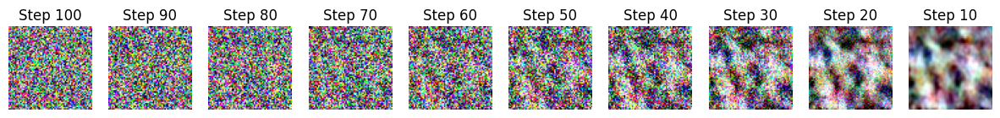

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

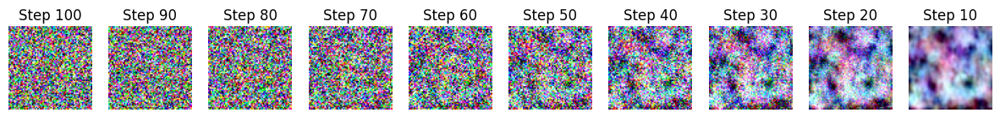

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

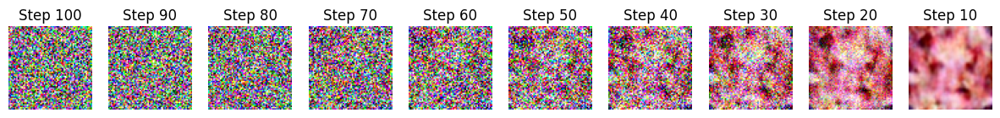

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

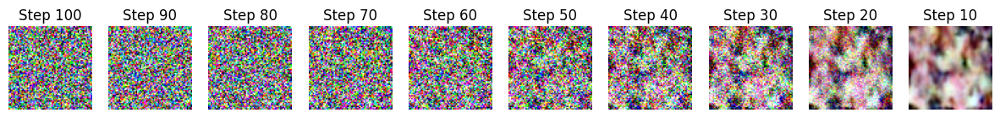

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

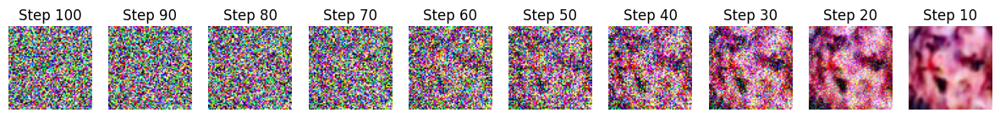

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

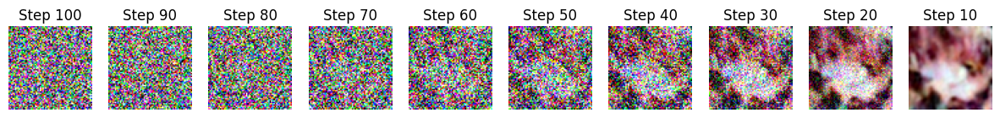

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

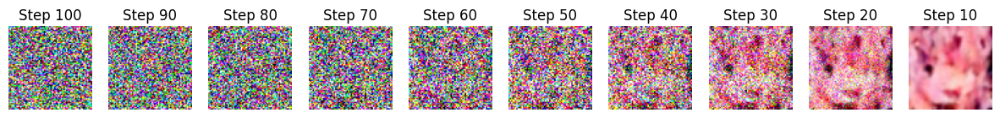

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

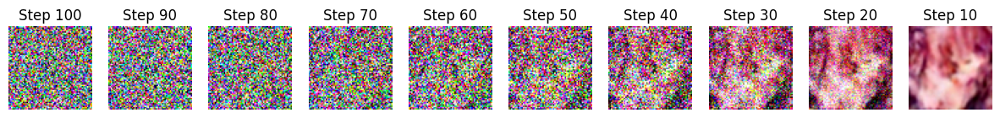

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

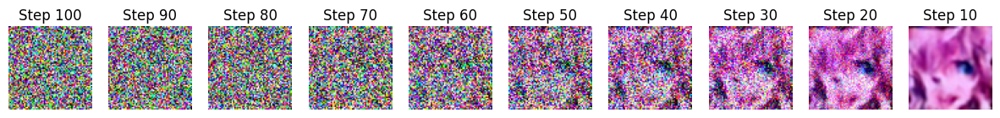

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

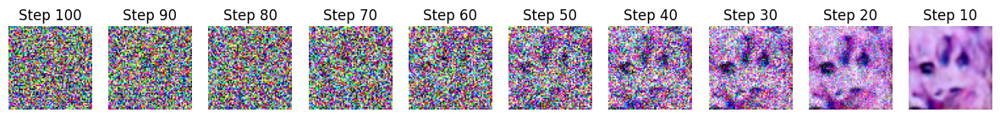

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

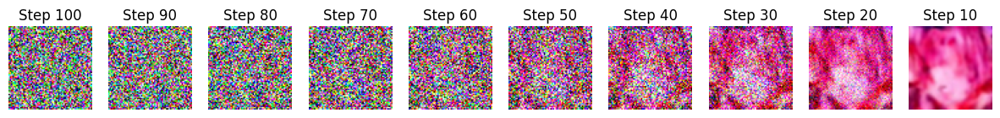

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

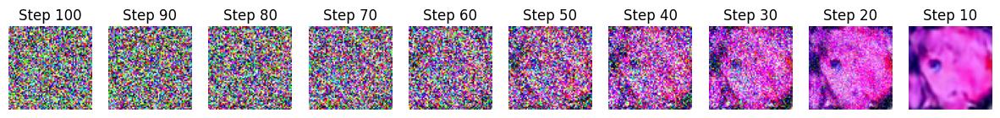

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

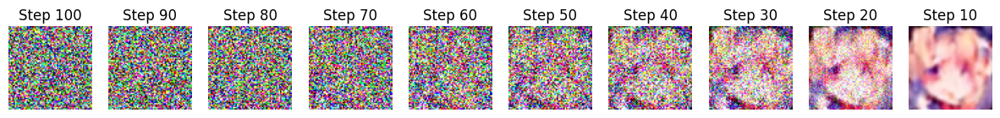

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

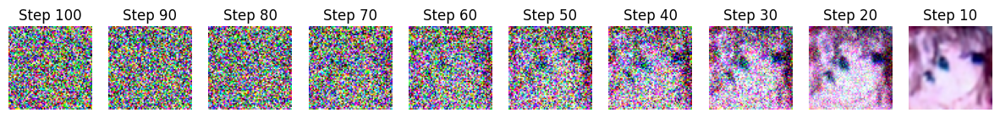

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

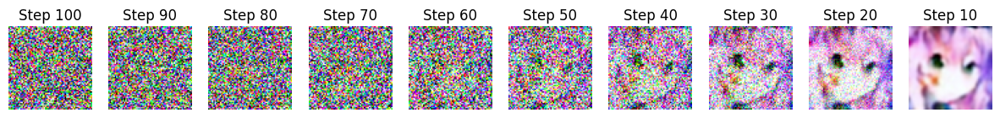

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

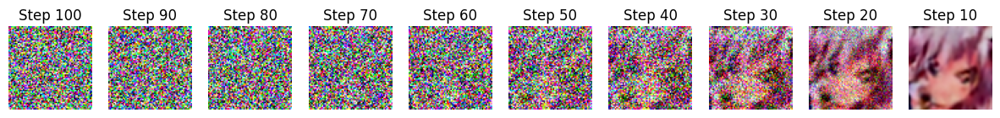

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

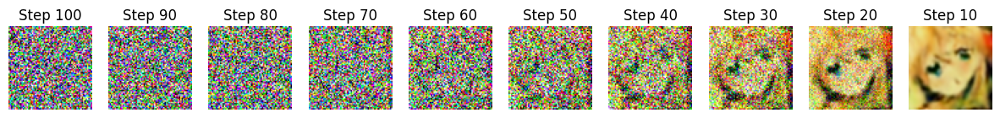

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

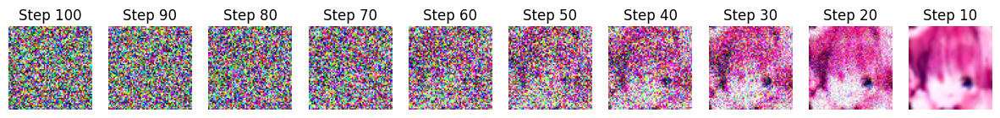

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

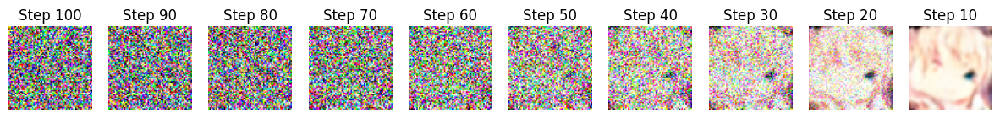

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

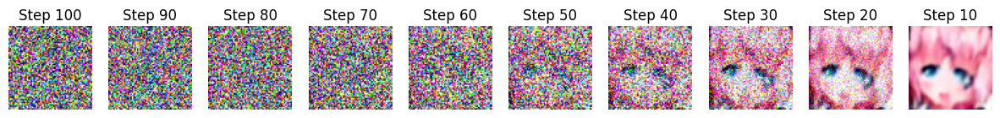

training complete


In [20]:
print("start")
path = '/kaggle/input/homework6-dataset/faces/faces'
IMG_SIZE = 64             # Size of images, do not change this if you do not know why you need to change
batch_size = 16
train_num_steps = 10000        # total training steps
lr = 1e-3
grad_steps = 1            # gradient accumulation steps, the equivalent batch size for updating equals to batch_size * grad_steps = 16 * 1
ema_decay = 0.995           # exponential moving average decay

channels = 16             # Numbers of channels of the first layer of CNN
dim_mults = (1, 2, 4)        # The model size will be (channels, 2 * channels, 4 * channels, 4 * channels, 2 * channels, channels)

timesteps = 100            # Number of steps (adding noise)
beta_schedule = 'linear'

print("参数设置完成")
model = Unet(
    dim = channels,
    dim_mults = dim_mults
)

diffusion = GaussianDiffusion(
    model,
    image_size = IMG_SIZE,
    timesteps = timesteps,
    beta_schedule = beta_schedule
)

trainer = Trainer(
    diffusion,
    path,
    train_batch_size = batch_size,
    train_lr = lr,
    train_num_steps = train_num_steps,
    gradient_accumulate_every = grad_steps,
    ema_decay = ema_decay,
    save_and_sample_every = 1000
)
print("start to train")
trainer.train()

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

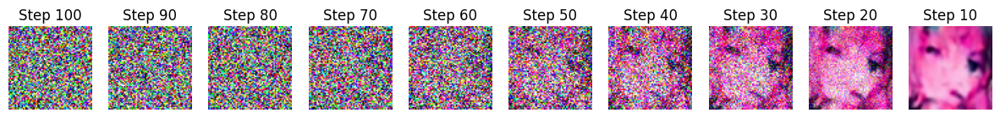

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

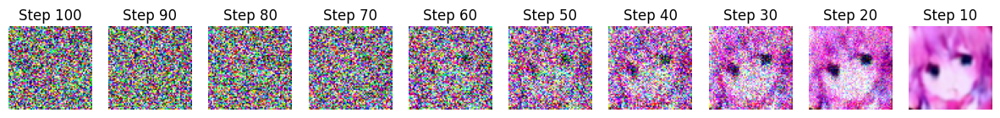

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

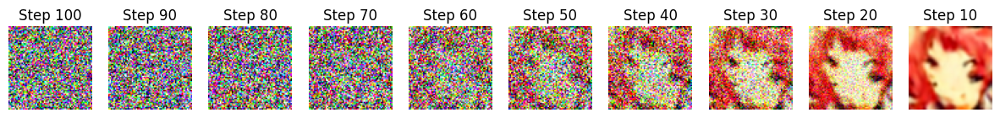

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

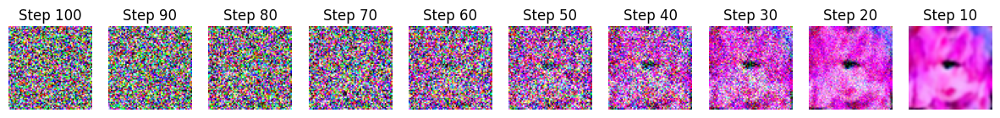

sampling loop time step:   0%|          | 0/100 [00:00<?, ?it/s]

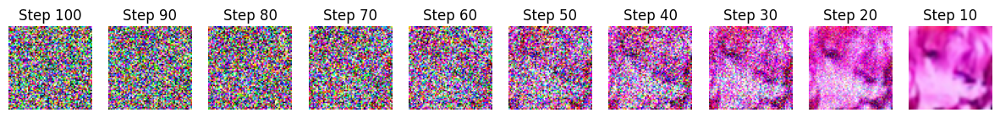

In [22]:
ckpt = '/kaggle/working/results/model-9.pt'
trainer.load(ckpt)
trainer.inference()


In [24]:
%cd ./submission
!tar -zcf ../submission.tgz *.jpg
%cd ..

/kaggle/working/submission
/kaggle/working
